# Test 2: Compare with Greedy

- Code for test 2: comparison with greedy
- Plot a graph for speedupx and relative error.
- Filters so that datapoints are inside error threshold

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import os
from pathlib import Path
import sys
import seaborn as sns
import numpy as np

# Try to get the script directory
try:
    SCRIPT_DIR = Path(__file__).resolve().parent
except NameError:
    # For Jupyter
    SCRIPT_DIR = Path(os.getcwd()).resolve()

# File loc
PROJECT_ROOT = SCRIPT_DIR.parent
LOG_FILE = PROJECT_ROOT / "logs" / "exp2"
PLOT_DIR = PROJECT_ROOT / "logs" / "exp2" / "plots"

print(f"Looking for log file at: {LOG_FILE}")

def load_data(LOG_FILE):
    if not os.path.exists(LOG_FILE):
        print(f"Error: Log file not found at {LOG_FILE}")
        sys.exit(1)

    try:
        df = pd.read_csv(LOG_FILE)
        # Clean column
        df.columns = df.columns.str.strip()
        df.columns = df.columns.str.lower()
        
        # Rename
        if "dataset_name" in df.columns:
            df.rename(columns={"dataset_name": "dataset"})
        if "g_obj" in df.columns:
            df.rename(columns={"g_obj": "greedy_obj"})
        if "speedupx" in df.columns:
            df.rename(columns={"speedupx": "speedup_x"})
        df = df[df['steps'] >= 1000]
        df['rel_err'] = (1 - df['ratio']) * 100 
        df['k_ratio'] = df['k'] / df['p'] 
        return df
    except Exception as e:
        print(f"Error reading CSV: {e}")
        sys.exit(1)

Looking for log file at: /Users/nautilus/gridfw/logs/exp2


In [4]:
SPARSE_LOG = LOG_FILE / "compare_small_k.csv"
ENTIRE_LOG = LOG_FILE / "compare_k_log.csv"
sparse_df = load_data(SPARSE_LOG)
df = load_data(ENTIRE_LOG)

In [5]:
# Verify that we have minium 1000 steps
df[df['steps'] >= 1000]

,timestamp,dataset,p,experiment,k,steps,samples,alpha,greedy_obj,fw_obj,ratio,greedy_time_s,fw_time_s,speedup_x,status,rel_err,k_ratio
0,2026-01-28 17:30:59,Secom,478,compare_k239_a0.2_m200_block_1,239,4780,200,0.2,473.2312,472.4897,0.9984,32.0804,25.6579,1.2503,DONE,0.16,0.500000
3,2026-01-28 17:31:25,Secom,478,compare_k143_a0.2_m500_block_1,143,2860,500,0.2,429.4074,425.6511,0.9913,10.1344,31.4337,0.3224,DONE,0.87,0.299163
4,2026-01-28 17:31:39,Secom,478,compare_k95_a0.2_m500_block_1,95,1900,500,0.2,375.7530,369.6303,0.9837,3.6402,22.2053,0.1639,DONE,1.63,0.198745
5,2026-01-28 17:31:45,Synthetic_high_corr,500,compare_k5_a0.1_m20_block_1,5,1000,20,0.1,123.6937,122.9661,0.9941,0.0579,2.9501,0.0196,DONE,0.59,0.010000
6,2026-01-28 17:31:46,Secom,478,compare_k239_a0.2_m200_block_1,239,4780,200,0.2,473.2312,472.6419,0.9988,32.7733,28.0381,1.1689,DONE,0.12,0.500000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
431,2026-01-28 18:45:21,Myocardial,111,compare_k1_a0.2_m500_block_1,1,1000,500,0.2,2.8590,2.8590,1.0000,0.0013,2.4121,0.0005,DONE,0.00,0.009009
432,2026-01-28 18:45:23,Myocardial,111,compare_k11_a0.2_m500_block_1,11,1000,500,0.2,21.5093,21.1036,0.9811,0.0133,2.4171,0.0055,DONE,1.89,0.099099
433,2026-01-28 18:45:26,Myocardial,111,compare_k22_a0.2_m500_block_1,22,1000,500,0.2,35.2432,34.6643,0.9836,0.0327,2.3891,0.0137,DONE,1.64,0.198198
434,2026-01-28 18:45:28,Myocardial,111,compare_k33_a0.2_m500_block_1,33,1000,500,0.2,46.9708,46.4971,0.9899,0.0614,2.3978,0.0256,DONE,1.01,0.297297


# Table and important values

In [6]:
def extract_table(df, dataset_names=None, tolerance=-3.0 ):
    df = df.copy()
    results = []
    
    # Iterate : Dataset and m
    for (ds, m), group in df.groupby(['dataset', 'samples']):
        
        # A. Max Speedup
        max_speedup = group['speedup_x'].max()
        
        # B. Critical k/p (Where speedupx approx 1)
        sorted_group = group.sort_values('k_ratio')
        critical_kp = np.nan
        for i in range(len(sorted_group)):
            # Check if current and all subsequent errors are above threshold
            if (sorted_group.iloc[i:]['rel_err'] >= tolerance).all():
                critical_kp = sorted_group.iloc[i]['k_ratio']
                break
        
        # C. Max Error (Worst case) and its location
        max_err_idx = group['rel_err'].idxmax() # Most negative
        max_err_val = group.loc[max_err_idx, 'rel_err']
        max_err_loc = group.loc[max_err_idx, 'k_ratio']
        
        # D. Min Error (Best case) and its location
        min_err_idx = group['rel_err'].idxmin() # Most positive/closest to zero
        min_err_val = group.loc[min_err_idx, 'rel_err']
        min_err_loc = group.loc[min_err_idx, 'k_ratio']
        
        results.append({
            "Dataset": ds,
            "m": m,
            "Max Speedup": f"{max_speedup:.2f}x",
            "Critical k/p": f"{critical_kp:.3f}" if not np.isnan(critical_kp) else "> 0.5",
            "Max Error %": f"{max_err_val:.2f}% (at {max_err_loc:.2f})",
            "Min Error %": f"{min_err_val:.2f}% (at {min_err_loc:.2f})"
        })

    return pd.DataFrame(results).sort_values(['Dataset', 'm'])

In [7]:
table_df = extract_table(df)
table_df.to_latex()

'\\begin{tabular}{llrllll}\n\\toprule\n & Dataset & m & Max Speedup & Critical k/p & Max Error % & Min Error % \\\\\n\\midrule\n0 & Arrhythmia & 20 & 1.93x & 0.008 & 12.81% (at 0.01) & 0.02% (at 0.50) \\\\\n1 & Arrhythmia & 50 & 1.36x & 0.008 & 11.94% (at 0.01) & -0.02% (at 0.50) \\\\\n2 & Arrhythmia & 100 & 0.91x & 0.008 & 6.90% (at 0.01) & 0.03% (at 0.50) \\\\\n3 & Arrhythmia & 200 & 0.56x & 0.008 & 8.62% (at 0.01) & 0.13% (at 0.50) \\\\\n4 & Arrhythmia & 500 & 0.24x & 0.008 & 8.42% (at 0.01) & 0.27% (at 0.50) \\\\\n5 & Madelon & 20 & 3.49x & 0.010 & 8.91% (at 0.01) & 0.44% (at 0.50) \\\\\n6 & Madelon & 50 & 2.88x & 0.010 & 1.28% (at 0.10) & 0.27% (at 0.01) \\\\\n7 & Madelon & 100 & 2.28x & 0.010 & 0.74% (at 0.01) & 0.25% (at 0.50) \\\\\n8 & Madelon & 200 & 1.58x & 0.010 & 6.59% (at 0.01) & 0.18% (at 0.50) \\\\\n9 & Madelon & 500 & 0.77x & 0.010 & 6.64% (at 0.01) & 0.13% (at 0.50) \\\\\n10 & Mnist & 20 & 4.22x & 0.009 & 18.65% (at 0.01) & -0.26% (at 0.50) \\\\\n11 & Mnist & 50 & 3.62

In [8]:
# For small and large m
table_df[table_df['m'].isin([50])]

,Dataset,m,Max Speedup,Critical k/p,Max Error %,Min Error %
1,Arrhythmia,50,1.36x,0.008,11.94% (at 0.01),-0.02% (at 0.50)
6,Madelon,50,2.88x,0.010,1.28% (at 0.10),0.27% (at 0.01)
11,Mnist,50,3.62x,0.009,28.27% (at 0.01),-0.21% (at 0.50)
16,Myocardial,50,0.36x,0.009,13.55% (at 0.01),0.00% (at 0.01)
21,Residential,50,0.31x,0.010,4.25% (at 0.10),0.00% (at 0.01)
26,Secom,50,2.68x,0.008,9.19% (at 0.01),0.02% (at 0.01)
31,Synthetic_high_corr,50,3.91x,0.010,0.39% (at 0.01),0.01% (at 0.50)
36,Synthetic_toeplitz,50,2.90x,0.010,4.21% (at 0.01),-0.25% (at 0.50)


# Plotting

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from pathlib import Path

# Assuming PROJECT_ROOT is defined in your environment
# PROJECT_ROOT = Path(".") 

def plot_acc_time(df, target_datasets, samples, fixed_alpha, tolerance_threshold=-3.0):
    # 1. Filter Data
    df_plot = df[
        (df["dataset"].str.lower().isin([d.lower() for d in target_datasets])) & 
        (df["samples"] == samples) & 
        (df["alpha"] == fixed_alpha)
    ].copy()

    if df_plot.empty:
        print("No data found for the specified parameters.")
        return


    # 2. Metrics Calculation
    df_plot["k_ratio"] = df_plot["k"] / df_plot["p"]
    
    # Calculate Relative Improvement
    df_plot["rel_imp"] = df_plot.apply(
        lambda x: ((x["fw_obj"] - x["greedy_obj"]) / x["greedy_obj"] * 100) 
        if x["greedy_obj"] != 0 else 0, axis=1
    )
    
    # Calculate Valid Speedup (filtering out bad accuracy points)
    df_plot["valid_speedup"] = df_plot.apply(
        lambda x: x["speedup_x"] if x["rel_imp"] >= tolerance_threshold else np.nan, 
        axis=1
    )

    # --- UPDATED: Massive Font Sizes for Maximum Readability ---
    sns.set_theme(style="whitegrid", font_scale=1.8) # Base scale up further
    line_props = {'linewidth': 5, 'markersize': 14}  
    
    # NEW SIZES:
    font_sizes = {
        'title': 32,   # Massive Title
        'label': 28,   # Axis Labels (Names)
        'tick': 24,    # Axis Numbers (Values) <--- INCREASED
        'legend': 18,  # Legend Text <--- INCREASED
        'leg_title': 26 # Legend Title
    }

    # ==========================================================================
    # GRAPH 1: ACCURACY PLOT
    # ==========================================================================
    plt.figure(figsize=(16, 10)) # Slightly wider to accommodate large fonts
    
    ax1 = sns.lineplot(
        data=df_plot, x="k_ratio", y="rel_imp", 
        hue="dataset", style="dataset", 
        markers=True, dashes=False, 
        **line_props
    )
    
    # Reference Lines
    plt.axhline(0, color='black', linestyle='-', linewidth=3, alpha=0.8)
    plt.axhline(tolerance_threshold, color='red', linestyle='--', linewidth=4, label=f'Threshold ({tolerance_threshold}%)')
    
    # Titles and Labels
    plt.title(f"Accuracy Relative to Greedy\n(m={samples}, alpha={fixed_alpha})", 
              fontsize=font_sizes['title'], fontweight='bold', pad=30)
    plt.ylabel("Relative Improvement (%)", fontsize=font_sizes['label'], fontweight='bold', labelpad=20)
    plt.xlabel("Selection Ratio (k/p)", fontsize=font_sizes['label'], fontweight='bold', labelpad=20)
    
    # Ticks (The Numbers)
    plt.xticks(fontsize=font_sizes['tick'], fontweight='bold') # Bold numbers often look better
    plt.yticks(fontsize=font_sizes['tick'], fontweight='bold')
    plt.ylim(-10, 5) 
    plt.xlim(0, 0.55)

    # Legend
    plt.legend(title="Dataset", title_fontsize=font_sizes['leg_title'], fontsize=font_sizes['legend'], 
               loc='lower right', frameon=True, shadow=True, fancybox=True)

    plt.grid(True, alpha=0.5, linewidth=1.5)
    plt.tight_layout()
    
    # Save Graph 1
    save_path_acc = PLOT_DIR / f"accuracy_alpha{fixed_alpha}_m{samples}.pdf"
    save_path_acc.parent.mkdir(parents=True, exist_ok=True)
    plt.savefig(save_path_acc, dpi=300)
    print(f"Saved Accuracy Plot: {save_path_acc.name}")
    plt.show()

    # ==========================================================================
    # GRAPH 2: SPEEDUP PLOT
    # ==========================================================================
    plt.figure(figsize=(16, 10)) 
    
    ax2 = sns.lineplot(
        data=df_plot, x="k_ratio", y="valid_speedup", 
        hue="dataset", style="dataset", 
        markers=True, dashes=False, 
        **line_props
    )
    
    # Reference Line
    plt.axhline(1.0, color='black', linestyle='--', linewidth=3, alpha=0.8)

    # Titles and Labels
    plt.title(f"Speedup Factor (Admissible Solutions Only)\n(m={samples}, alpha={fixed_alpha})", 
              fontsize=font_sizes['title'], fontweight='bold', pad=30)
    plt.ylabel("Speedup (x Times Faster)", fontsize=font_sizes['label'], fontweight='bold', labelpad=20)
    plt.xlabel("Selection Ratio (k/p)", fontsize=font_sizes['label'], fontweight='bold', labelpad=20)

    # Ticks
    plt.xticks(fontsize=font_sizes['tick'], fontweight='bold')
    plt.yticks(fontsize=font_sizes['tick'], fontweight='bold')
    plt.xlim(0, 0.60)
    
    # Legend
    plt.legend(title="Dataset", title_fontsize=font_sizes['leg_title'], fontsize=font_sizes['legend'], 
               loc='upper left', frameon=True, shadow=True, fancybox=True)

    plt.grid(True, alpha=0.5, linewidth=1.5)
    plt.tight_layout()

    # Save Graph 2
    save_path_speed = PLOT_DIR / f"speedup_alpha{fixed_alpha}_m{samples}.pdf"
    plt.savefig(save_path_speed, dpi=300)
    print(f"Saved Speedup Plot: {save_path_speed.name}")
    plt.show()

# --- Run it ---
# targets = ["synthetic_high_corr", "synthetic_toeplitz", "mnist", "residential", "secom"] 
# plot_separate_thesis_graphs_large(df, targets, samples=1000, fixed_alpha=0.1)

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from pathlib import Path

# Assuming PROJECT_ROOT is defined in your environment
# PROJECT_ROOT = Path(".") 

def plot_small_k_separate(df, target_datasets, samples, fixed_alpha, tolerance_threshold=-3.0):
    # 1. Filter Data (Using your specific column names)
    df_plot = df[
        (df["dataset_name"].str.lower().isin([d.lower() for d in target_datasets])) & 
        (df["samples"] == samples) & 
        (df["alpha"] == fixed_alpha)
    ].copy()

    if df_plot.empty:
        print("No data found for the specified parameters.")
        return

    # 2. Metrics Calculation
    df_plot["k_ratio"] = df_plot["k"] / df_plot["p"]
    
    # Calculate Relative Improvement
    df_plot["rel_imp"] = df_plot.apply(
        lambda x: ((x["fw_obj"] - x["g_obj"]) / x["g_obj"] * 100) 
        if x["g_obj"] != 0 else 0, axis=1
    )
    
    # Calculate Valid Speedup
    df_plot["valid_speedup"] = df_plot.apply(
        lambda x: x["speedupx"] if x["rel_imp"] >= tolerance_threshold else np.nan, 
        axis=1
    )

    # --- VISUAL STYLE: Massive Fonts ---
    sns.set_theme(style="whitegrid", font_scale=1.8) 
    line_props = {'linewidth': 5, 'markersize': 14}  
    
    font_sizes = {
        'title': 32,   
        'label': 28,   
        'tick': 24,    
        'legend': 24,  
        'leg_title': 26 
    }

    # ==========================================================================
    # GRAPH 1: ACCURACY PLOT (Sparse Regime)
    # ==========================================================================
    plt.figure(figsize=(16, 10))
    
    sns.lineplot(
        data=df_plot, x="k_ratio", y="rel_imp", 
        hue="dataset_name", style="dataset_name", 
        markers=True, dashes=False, 
        **line_props
    )
    
    # Reference Lines
    plt.axhline(0, color='black', linestyle='-', linewidth=3, alpha=0.8)
    plt.axhline(tolerance_threshold, color='red', linestyle='--', linewidth=4, label=f'Threshold ({tolerance_threshold}%)')
    
    # Labels & Ticks
    plt.title(f"Accuracy Relative to Greedy\n(Sparse Regime: k/p < 0.3)", 
              fontsize=font_sizes['title'], fontweight='bold', pad=30)
    plt.ylabel("Relative Improvement (%)", fontsize=font_sizes['label'], fontweight='bold', labelpad=20)
    plt.xlabel("Selection Ratio (k/p)", fontsize=font_sizes['label'], fontweight='bold', labelpad=20)
    
    plt.xticks(fontsize=font_sizes['tick'], fontweight='bold')
    plt.yticks(fontsize=font_sizes['tick'], fontweight='bold')
    
    # Limits for Sparse Analysis
    plt.ylim(-10, 5) 
    plt.xlim(0, 0.3) 

    # Legend (Lower Right for Accuracy)
    plt.legend(title="Dataset", title_fontsize=font_sizes['leg_title'], fontsize=font_sizes['legend'], 
               loc='lower right', frameon=True, shadow=True, fancybox=True)

    plt.grid(True, alpha=0.5, linewidth=1.5)
    plt.tight_layout()
    
    # Save Graph 1
    save_path_acc = PROJECT_ROOT / "logs" / "exp2" / "plots" / f"accuracy_sparse_alpha{fixed_alpha}_m{samples}.pdf"
    save_path_acc.parent.mkdir(parents=True, exist_ok=True)
    plt.savefig(save_path_acc, dpi=300)
    print(f"Saved Accuracy Plot: {save_path_acc.name}")
    plt.show()

    # ==========================================================================
    # GRAPH 2: SPEEDUP PLOT (Sparse Regime)
    # ==========================================================================
    plt.figure(figsize=(16, 10)) 
    
    sns.lineplot(
        data=df_plot, x="k_ratio", y="valid_speedup", 
        hue="dataset_name", style="dataset_name", 
        markers=True, dashes=False, 
        **line_props
    )
    
    # Reference Line
    plt.axhline(1.0, color='black', linestyle='--', linewidth=3, alpha=0.8)

    # Labels & Ticks
    plt.title(f"Speedup Factor (Admissible Only)\n(Sparse Regime: k/p < 0.3)", 
              fontsize=font_sizes['title'], fontweight='bold', pad=30)
    plt.ylabel("Speedup (x Times Faster)", fontsize=font_sizes['label'], fontweight='bold', labelpad=20)
    plt.xlabel("Selection Ratio (k/p)", fontsize=font_sizes['label'], fontweight='bold', labelpad=20)

    plt.xticks(fontsize=font_sizes['tick'], fontweight='bold')
    plt.yticks(fontsize=font_sizes['tick'], fontweight='bold')
    
    # Limits for Sparse Analysis
    plt.xlim(0, 0.3) 
    
    # Legend (Upper Left for Speedup)
    plt.legend(title="Dataset", title_fontsize=font_sizes['leg_title'], fontsize=font_sizes['legend'], 
               loc='upper left', frameon=True, shadow=True, fancybox=True)

    plt.grid(True, alpha=0.5, linewidth=1.5)
    plt.tight_layout()

    # Save Graph 2
    save_path_speed = PROJECT_ROOT / "logs" / "exp2" / "plots" / f"speedup_sparse_alpha{fixed_alpha}_m{samples}.pdf"
    plt.savefig(save_path_speed, dpi=300)
    print(f"Saved Speedup Plot: {save_path_speed.name}")
    plt.show()

Plot graph for every combination of $\alpha$ and $m$.

In [17]:
def plot_time_complexity(df, target_dataset, fixed_alpha=0.2, samples=50):
    """
    Plots the absolute runtime (seconds) of FW-Homotopy vs Greedy
    to demonstrate the 'Constant Time' property of FW.
    """
    
    # 1. Filter for ONE dataset (Time scales vary too much to aggregate)
    # We choose a large dataset where the difference is obvious
    subset = df[
        (df["dataset"].str.lower() == target_dataset.lower()) & 
        (df["alpha"] == fixed_alpha) &
        (df["samples"] == samples)
    ].copy()

    if subset.empty:
        print(f"No data found for {target_dataset}")
        return

    # 2. Reshape Data for Seaborn (Wide -> Long format)
    # We want one column for 'Time' and one for 'Method'
    time_df = subset.melt(
        id_vars=["k_ratio"], 
        value_vars=["fw_time_s", "greedy_time_s"],
        var_name="Method", 
        value_name="Time (s)"
    )
    
    # Rename for legend beauty
    time_df["Method"] = time_df["Method"].replace({
        "fw_time_s": "FW-Homotopy",
        "greedy_time_s": "Greedy"
    })

    # --- STYLE: Massive Fonts ---
    sns.set_theme(style="whitegrid", font_scale=1.8)
    line_props = {'linewidth': 6, 'markersize': 16} # Even thicker for impact
    
    font_sizes = {
        'title': 32,   
        'label': 28,   
        'tick': 24,    
        'legend': 24
    }

    # 3. Create Plot
    plt.figure(figsize=(16, 10))
    
    # Plot Lines
    sns.lineplot(
        data=time_df, x="k_ratio", y="Time (s)", hue="Method", style="Method",
        markers=True, dashes=False, palette=["#005b96", "#d62728"], # Blue vs Red
        **line_props
    )

    # 4. Annotations & Polish
    plt.title(f"Runtime Scalability Analysis: {target_dataset.capitalize()}\n(Fixed Iterations $n$ vs. Iterative Selection)", 
              fontsize=font_sizes['title'], fontweight='bold', pad=30)
    
    plt.ylabel("Execution Time (Seconds)", fontsize=font_sizes['label'], fontweight='bold', labelpad=20)
    plt.xlabel("Selection Ratio (k/p)", fontsize=font_sizes['label'], fontweight='bold', labelpad=20)
    
    plt.xticks(fontsize=font_sizes['tick'], fontweight='bold')
    plt.yticks(fontsize=font_sizes['tick'], fontweight='bold')
    
    # Force Y-axis to start at 0 to show the "Constant" nature clearly
    plt.ylim(bottom=0)

    # Legend
    plt.legend(title=None, fontsize=font_sizes['legend'], loc='upper left', 
               frameon=True, shadow=True, fancybox=True)

    plt.grid(True, alpha=0.5, linewidth=1.5)
    plt.tight_layout()

    # 5. Save
    save_path = PROJECT_ROOT / "logs" / "exp2" / "plots" / f"time_{target_dataset}.pdf"
    save_path.parent.mkdir(parents=True, exist_ok=True)
    plt.savefig(save_path, dpi=300)
    print(f"Saved Time Plot: {save_path.name}")
    # plt.show()

In [16]:
import pandas as pd
import numpy as np

def generate_stability_proof_table(df, fixed_alpha=0.2, fixed_samples=50):
    print("Generating Stability Proof Table...\n")
    
    # Filter data
    subset = df[
        (df['alpha'] == fixed_alpha) & 
        (df['samples'] == fixed_samples)
    ].copy()
    
    # We will build a list of rows for the dataframe
    table_rows = []
    
    for dataset_name in subset['dataset'].unique():
        ds_data = subset[subset['dataset'] == dataset_name]
        
        # 1. Analyze FW-Homotopy Time (Is it constant?)
        fw_mean = ds_data['fw_time_s'].mean()
        fw_std  = ds_data['fw_time_s'].std()
        
        # 2. Analyze Greedy Time (Does it grow?)
        greedy_min = ds_data['greedy_time_s'].min()
        greedy_max = ds_data['greedy_time_s'].max()
        
        # 3. Calculate the "Growth Factor" (How much slower does Greedy get?)
        # A factor of 10x means Greedy is 10x slower at the end than at the start
        if greedy_min > 0:
            growth_factor = greedy_max / greedy_min
        else:
            growth_factor = np.nan
            
        table_rows.append({
            "Dataset": dataset_name.capitalize(),
            "FW Mean (s)": fw_mean,
            "FW Std": fw_std,
            "Greedy Min (s)": greedy_min,
            "Greedy Max (s)": greedy_max,
            "Greedy Growth": growth_factor
        })
        
    # Convert to DataFrame for sorting
    summary_df = pd.DataFrame(table_rows).sort_values("FW Mean (s)")
    
    # --- PRINT LATEX ---
    print("\\begin{table}[h]")
    print("\\centering")
    print("\\small")
    print("\\begin{tabular}{l|cc|cc|c}")
    print("\\hline")
    print("\\textbf{Dataset} & \\multicolumn{2}{c|}{\\textbf{FW-Homotopy (Ours)}} & \\multicolumn{2}{c|}{\\textbf{Greedy (Baseline)}} & \\textbf{Trend} \\\\")
    print(" & \\textbf{Avg Time (s)} & \\textbf{Stability ($\\pm$)} & \\textbf{Start (s)} & \\textbf{End (s)} & \\textbf{Growth} \\\\")
    print("\\hline")
    
    for _, row in summary_df.iterrows():
        # Formatting: 
        # FW is "Mean (+- Std)" to show it stays the same.
        # Greedy is "Min -> Max" to show it gets worse.
        fw_str = f"{row['FW Mean (s)']:.4f}"
        std_str = f"$\\pm${row['FW Std']:.4f}"
        
        greedy_start = f"{row['Greedy Min (s)']:.4f}"
        greedy_end   = f"{row['Greedy Max (s)']:.4f}"
        growth_str   = f"{row['Greedy Growth']:.1f}$\\times$"
        
        print(f"{row['Dataset']} & {fw_str} & {std_str} & {greedy_start} & {greedy_end} & {growth_str} \\\\")
        
    print("\\hline")
    print("\\end{tabular}")
    print("\\caption{Runtime Stability Analysis. Note that FW-Homotopy maintains a nearly constant runtime (low standard deviation) regardless of selection size $k$, whereas Greedy runtime grows linearly (high growth factor).}")
    print("\\label{tab:runtime_stability}")
    print("\\end{table}")

# Run it
generate_stability_proof_table(df)

Generating Stability Proof Table...

\begin{table}[h]
\centering
\small
\begin{tabular}{l|cc|cc|c}
\hline
\textbf{Dataset} & \multicolumn{2}{c|}{\textbf{FW-Homotopy (Ours)}} & \multicolumn{2}{c|}{\textbf{Greedy (Baseline)}} & \textbf{Trend} \\
 & \textbf{Avg Time (s)} & \textbf{Stability ($\pm$)} & \textbf{Start (s)} & \textbf{End (s)} & \textbf{Growth} \\
\hline
Residential & 0.3242 & $\pm$0.0084 & 0.0011 & 0.1041 & 94.6$\times$ \\
Myocardial & 0.3426 & $\pm$0.0135 & 0.0023 & 0.1271 & 55.3$\times$ \\
Arrhythmia & 0.8695 & $\pm$0.4173 & 0.0089 & 2.1425 & 240.7$\times$ \\
Secom & 3.3880 & $\pm$2.3679 & 0.0209 & 19.0437 & 911.2$\times$ \\
Synthetic_high_corr & 3.7432 & $\pm$2.6089 & 0.0273 & 22.4667 & 823.0$\times$ \\
Madelon & 3.7567 & $\pm$2.6068 & 0.0268 & 22.4904 & 839.2$\times$ \\
Synthetic_toeplitz & 3.8311 & $\pm$2.5288 & 0.0469 & 22.6067 & 482.0$\times$ \\
Mnist & 7.5906 & $\pm$5.5748 & 0.0423 & 58.3799 & 1380.1$\times$ \\
\hline
\end{tabular}
\caption{Runtime Stability Analysis.

Saved Time Plot: time_synthetic_high_corr.pdf
Saved Time Plot: time_synthetic_toeplitz.pdf
Saved Time Plot: time_mnist.pdf
Saved Time Plot: time_residential.pdf
Saved Time Plot: time_secom.pdf
Saved Time Plot: time_myocardial.pdf
Saved Time Plot: time_arrhythmia.pdf
Saved Time Plot: time_madelon.pdf
Saved Time Plot: time_synthetic_high_corr.pdf
Saved Time Plot: time_synthetic_toeplitz.pdf
Saved Time Plot: time_mnist.pdf
Saved Time Plot: time_residential.pdf
Saved Time Plot: time_secom.pdf
Saved Time Plot: time_myocardial.pdf
Saved Time Plot: time_arrhythmia.pdf
Saved Time Plot: time_madelon.pdf
Saved Time Plot: time_synthetic_high_corr.pdf
Saved Time Plot: time_synthetic_toeplitz.pdf
Saved Time Plot: time_mnist.pdf
Saved Time Plot: time_residential.pdf
Saved Time Plot: time_secom.pdf


/var/folders/7c/q9_nslk55p94jf29j5gtcsxc0000gn/T/ipykernel_1557/1941500075.py:46: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(16, 10))


Saved Time Plot: time_myocardial.pdf
Saved Time Plot: time_arrhythmia.pdf
Saved Time Plot: time_madelon.pdf
No data found for synthetic_high_corr
No data found for synthetic_toeplitz
No data found for mnist
No data found for residential
No data found for secom
No data found for myocardial
No data found for arrhythmia
No data found for madelon
Saved Time Plot: time_synthetic_high_corr.pdf
Saved Time Plot: time_synthetic_toeplitz.pdf
Saved Time Plot: time_mnist.pdf
Saved Time Plot: time_residential.pdf
Saved Time Plot: time_secom.pdf
Saved Time Plot: time_myocardial.pdf
Saved Time Plot: time_arrhythmia.pdf
Saved Time Plot: time_madelon.pdf
Saved Time Plot: time_synthetic_high_corr.pdf
Saved Time Plot: time_synthetic_toeplitz.pdf
Saved Time Plot: time_mnist.pdf
Saved Time Plot: time_residential.pdf
Saved Time Plot: time_secom.pdf
Saved Time Plot: time_myocardial.pdf
Saved Time Plot: time_arrhythmia.pdf
Saved Time Plot: time_madelon.pdf
Saved Time Plot: time_synthetic_high_corr.pdf
Saved T

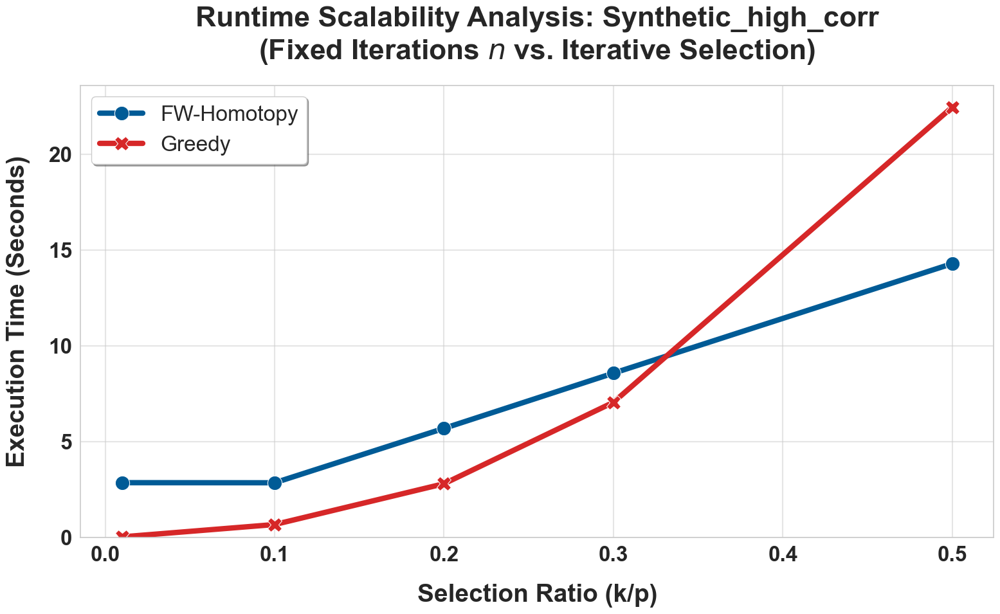

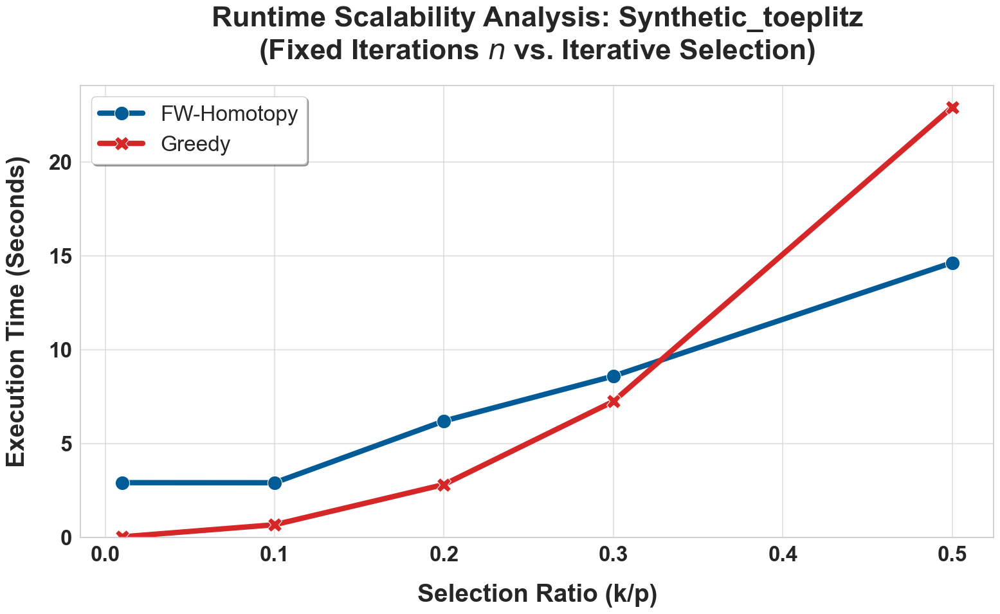

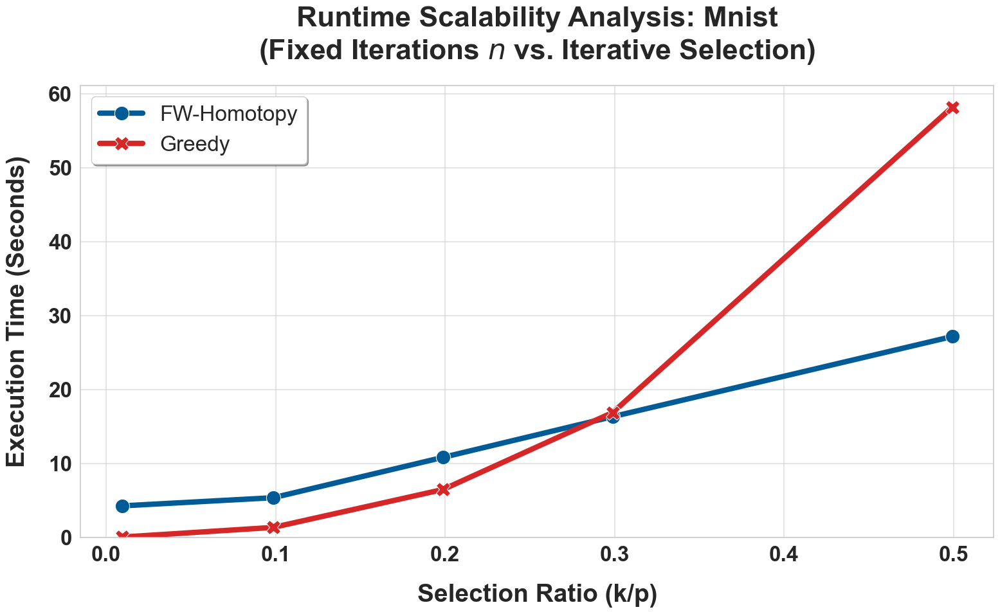

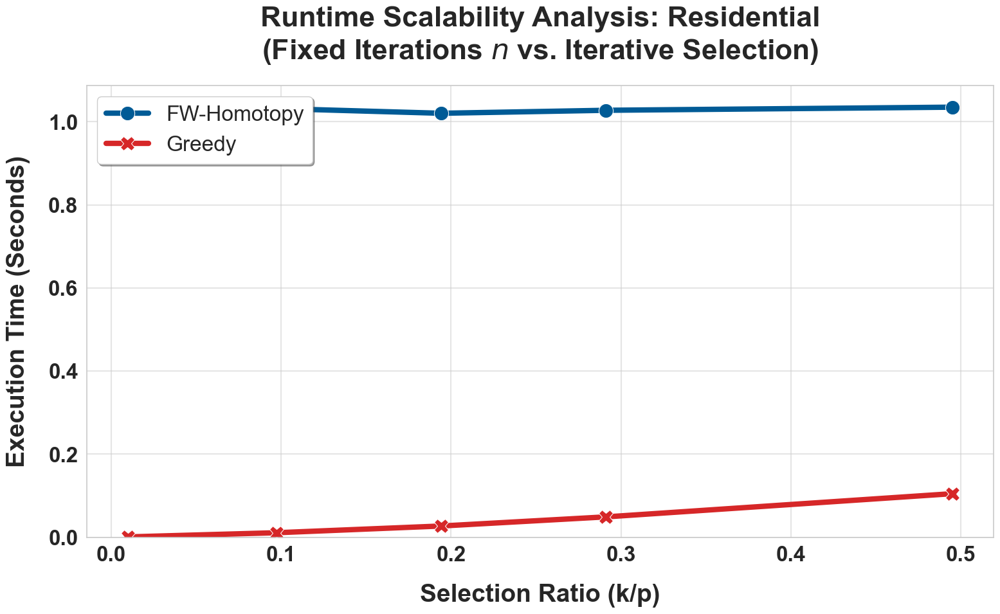

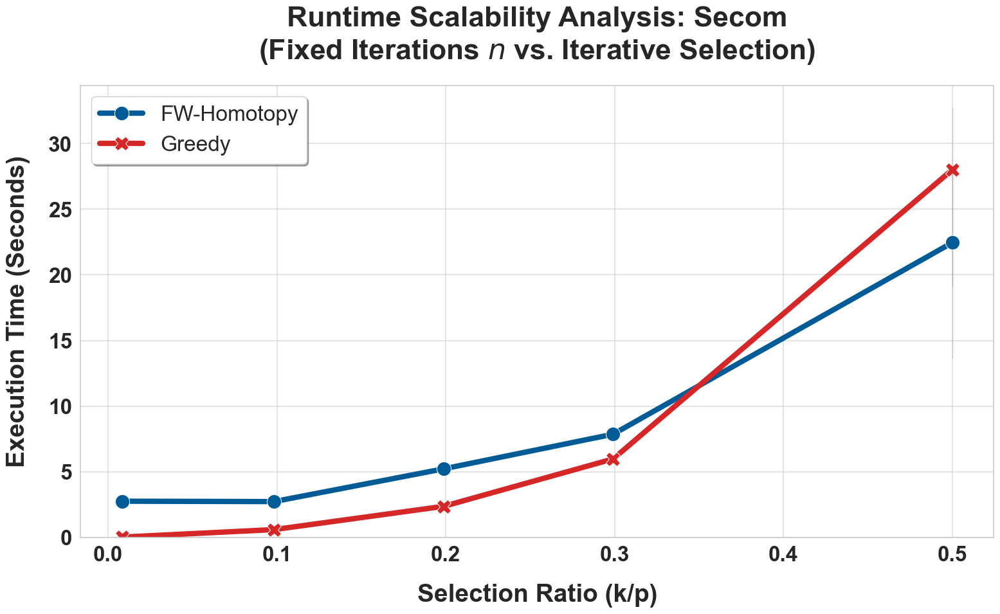

...

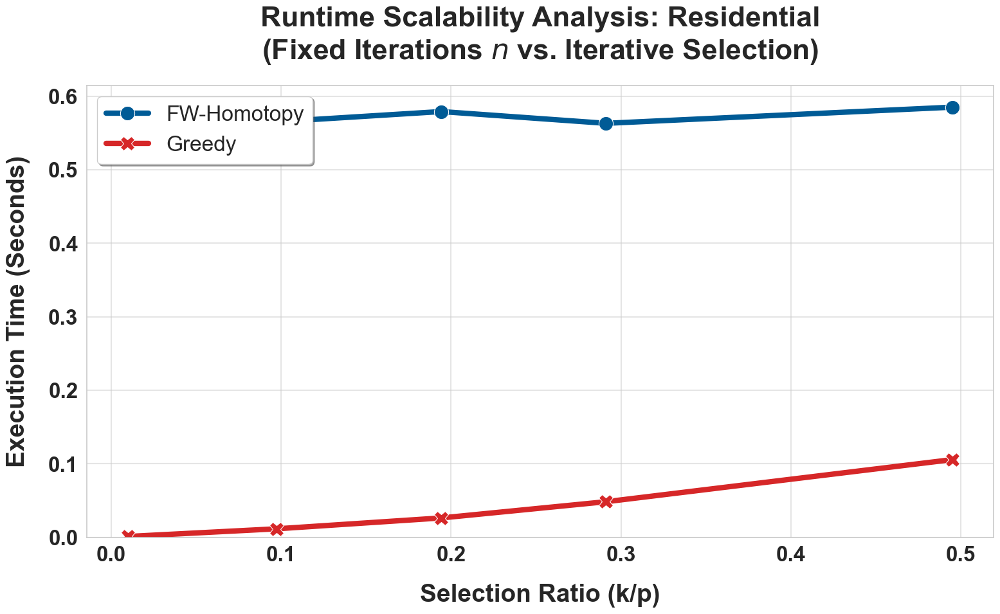

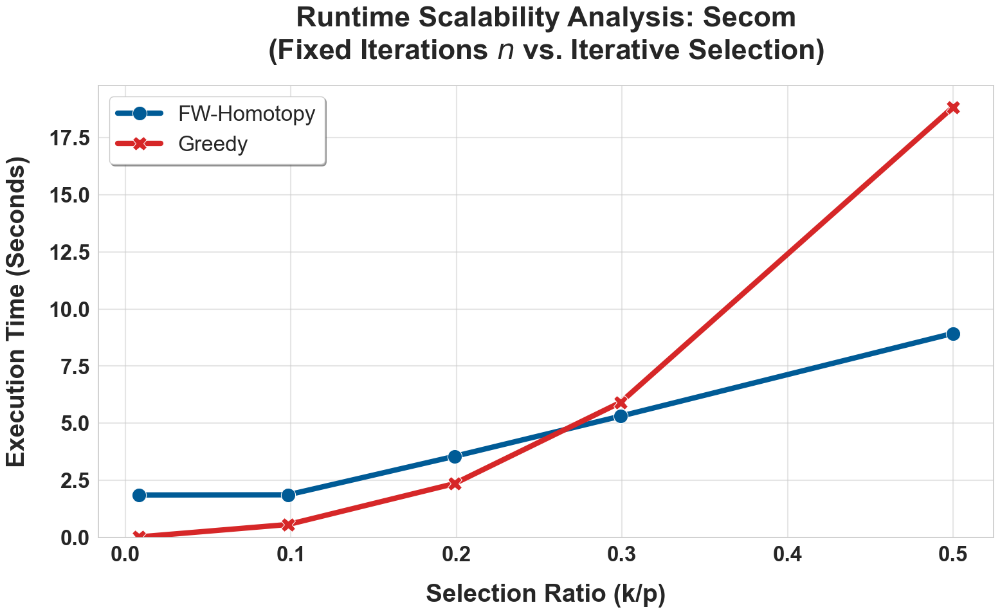

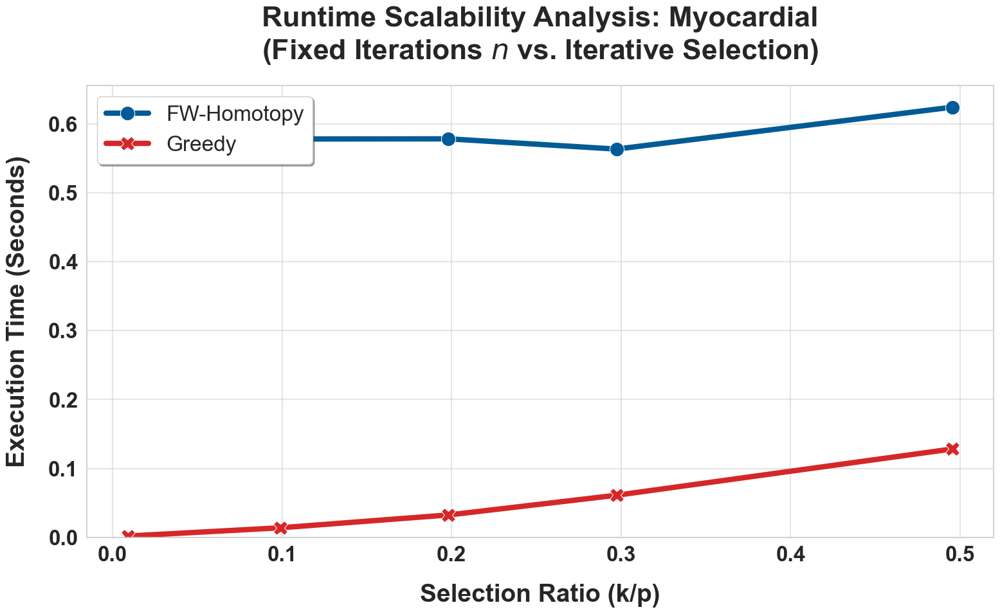

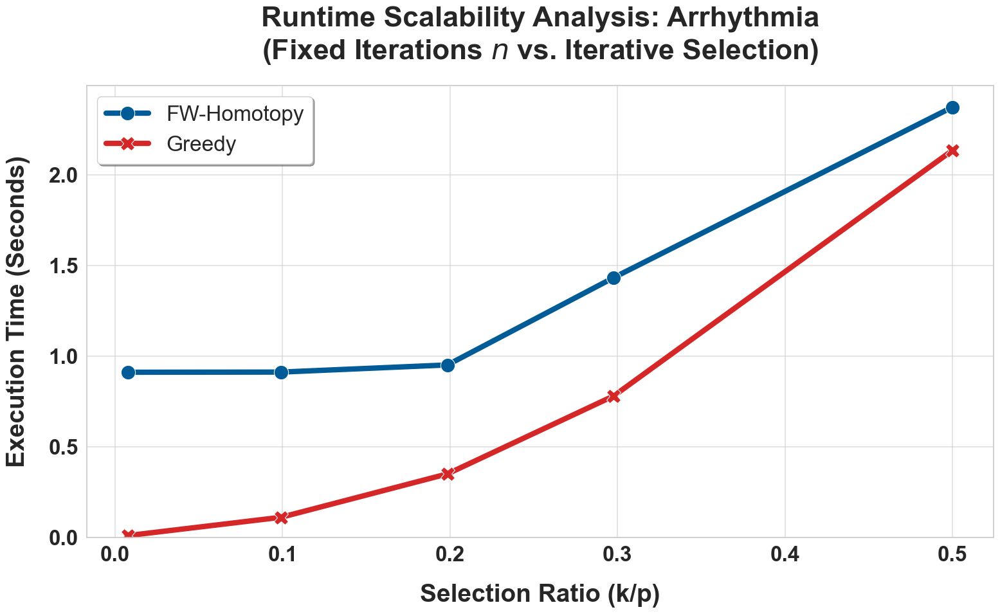

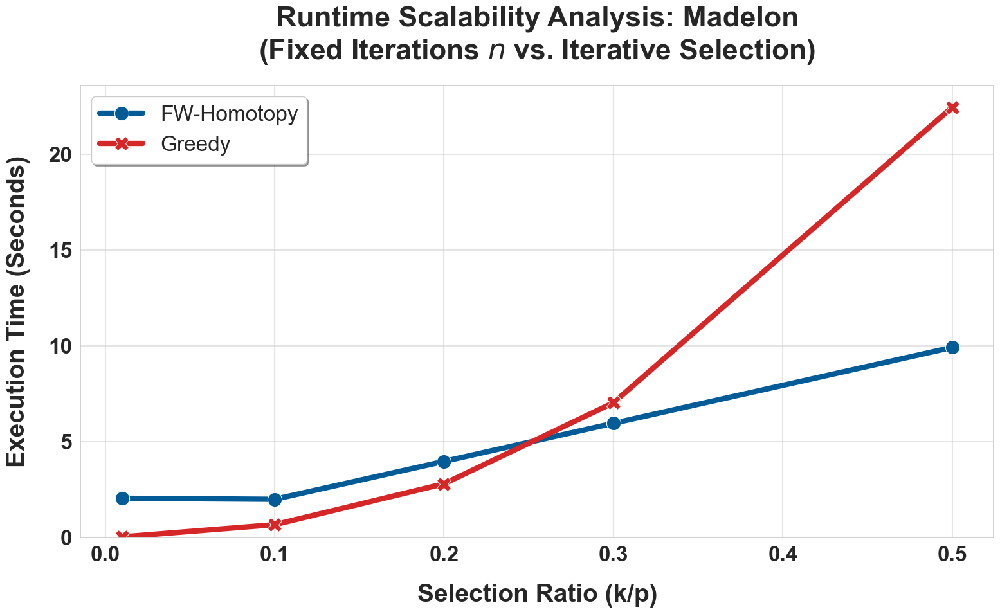

In [18]:
targets = ["synthetic_high_corr", "synthetic_toeplitz", "mnist", "residential", "secom", "myocardial", "arrhythmia", "madelon"] 
# Try with a tolerance of -3% (or -5% if you want to be lenient)
for s in df['samples'].unique():
    for a in df['alpha'].unique():
        for dataset in targets:
        # plot_small_k_separate(sparse_df, targets, samples=s, fixed_alpha=a, tolerance_threshold=-3.0)
        # plot_acc_time(df, targets, samples=s, fixed_alpha=a, tolerance_threshold=-3.0)
            plot_time_complexity(df, dataset, fixed_alpha=a, samples=s)

In [37]:
df

,timestamp,dataset,p,experiment,k,steps,samples,alpha,greedy_obj,fw_obj,ratio,greedy_time_s,fw_time_s,speedup_x,status,rel_err,k_ratio
0,2026-01-28 17:30:59,Secom,478,compare_k239_a0.2_m200_block_1,239,4780,200,0.2,473.2312,472.4897,0.9984,32.0804,25.6579,1.2503,DONE,0.16,0.500000
3,2026-01-28 17:31:25,Secom,478,compare_k143_a0.2_m500_block_1,143,2860,500,0.2,429.4074,425.6511,0.9913,10.1344,31.4337,0.3224,DONE,0.87,0.299163
4,2026-01-28 17:31:39,Secom,478,compare_k95_a0.2_m500_block_1,95,1900,500,0.2,375.7530,369.6303,0.9837,3.6402,22.2053,0.1639,DONE,1.63,0.198745
5,2026-01-28 17:31:45,Synthetic_high_corr,500,compare_k5_a0.1_m20_block_1,5,1000,20,0.1,123.6937,122.9661,0.9941,0.0579,2.9501,0.0196,DONE,0.59,0.010000
6,2026-01-28 17:31:46,Secom,478,compare_k239_a0.2_m200_block_1,239,4780,200,0.2,473.2312,472.6419,0.9988,32.7733,28.0381,1.1689,DONE,0.12,0.500000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
431,2026-01-28 18:45:21,Myocardial,111,compare_k1_a0.2_m500_block_1,1,1000,500,0.2,2.8590,2.8590,1.0000,0.0013,2.4121,0.0005,DONE,0.00,0.009009
432,2026-01-28 18:45:23,Myocardial,111,compare_k11_a0.2_m500_block_1,11,1000,500,0.2,21.5093,21.1036,0.9811,0.0133,2.4171,0.0055,DONE,1.89,0.099099
433,2026-01-28 18:45:26,Myocardial,111,compare_k22_a0.2_m500_block_1,22,1000,500,0.2,35.2432,34.6643,0.9836,0.0327,2.3891,0.0137,DONE,1.64,0.198198
434,2026-01-28 18:45:28,Myocardial,111,compare_k33_a0.2_m500_block_1,33,1000,500,0.2,46.9708,46.4971,0.9899,0.0614,2.3978,0.0256,DONE,1.01,0.297297


In [38]:
sparse_df

,experiment_name,k,steps,samples,alpha,g_obj,fw_obj,g_time,fw_time,dataset_name,p,ratio,speedupx,rel_err,k_ratio
0,sniper_k2_a0.2_m50,2,1000,50,0.2,32.452428,29.901409,0.015304,3.064295,arrhythmia,262,0.921392,0.004994,7.860796,0.007634
1,sniper_k5_a0.2_m50,5,1000,50,0.2,60.998413,56.223333,0.040690,3.053766,arrhythmia,262,0.921718,0.013325,7.828203,0.019084
2,sniper_k7_a0.2_m50,7,1000,50,0.2,74.431819,71.586762,0.057846,3.052714,arrhythmia,262,0.961776,0.018949,3.822366,0.026718
3,sniper_k10_a0.2_m50,10,1000,50,0.2,91.103502,87.811157,0.084969,3.052823,arrhythmia,262,0.963861,0.027833,3.613851,0.038168
4,sniper_k13_a0.2_m50,13,1000,50,0.2,104.404550,102.388178,0.115131,3.057535,arrhythmia,262,0.980687,0.037655,1.931307,0.049618
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,sniper_k105_a0.2_m50,105,2100,50,0.2,426.258840,425.942020,9.395415,19.476933,synthetic_toeplitz,500,0.999257,0.482387,0.074326,0.210000
196,sniper_k110_a0.2_m50,110,2200,50,0.2,430.300309,430.351401,10.748281,20.262609,synthetic_toeplitz,500,1.000119,0.530449,-0.011873,0.220000
197,sniper_k115_a0.2_m50,115,2300,50,0.2,434.203969,433.320184,12.166090,21.190915,synthetic_toeplitz,500,0.997965,0.574118,0.203542,0.230000
198,sniper_k120_a0.2_m50,120,2400,50,0.2,437.605285,437.151427,13.715963,21.967095,synthetic_toeplitz,500,0.998963,0.624387,0.103714,0.240000
